In [1]:
import matplotlib.pyplot as plt
%matplotlib inline
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.datasets import fetch_lfw_people
from sklearn.metrics import accuracy_score
from sklearn.svm import SVC
from sklearn.decomposition import PCA
import numpy
lfw_people = fetch_lfw_people(min_faces_per_person=70)
print(len(lfw_people.images))
print(lfw_people.target_names)

1288
['Ariel Sharon' 'Colin Powell' 'Donald Rumsfeld' 'George W Bush'
 'Gerhard Schroeder' 'Hugo Chavez' 'Tony Blair']


image:  [[ 113.66666412  114.          113.         ...,   93.66666412  124.          147.        ]
 [ 110.33333588  109.66666412  115.33333588 ...,   90.          115.33333588
   132.66667175]
 [ 108.          114.33333588  129.66667175 ...,   89.33333588  118.
   130.66667175]
 ..., 
 [  24.66666603   20.66666603   21.66666603 ...,   43.66666794
    45.66666794   47.66666794]
 [  22.33333397   20.33333397   22.         ...,   45.33333206
    46.33333206   46.66666794]
 [  20.66666603   19.66666603   22.33333397 ...,   46.           47.33333206
    47.        ]]


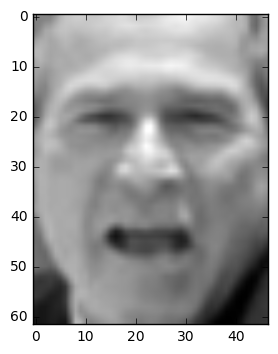

3
George W Bush
data:  [ 113.66666412  114.          113.         ...,   46.           47.33333206
   47.        ]
data length:  2914


In [2]:
image_num = 10 #try plugging in some other numbers too
#2D List 'images' is the whole image
print("image: ",lfw_people.images[image_num]) #a list of list
plt.imshow(lfw_people.images[image_num],cmap='gray')
plt.show()
img_target = lfw_people.target[image_num]
print(img_target)
print(lfw_people.target_names[img_target])
#'data' is just a line of pixels
print("data: ", lfw_people.data[image_num])
print("data length: ",len(lfw_people.data[image_num]))

In [45]:
#SVC
(train_data, test_data, train_target, test_target)\
= train_test_split(lfw_people.data, lfw_people.target,\
test_size = 0.2)
svc_classifier = SVC(kernel="rbf", gamma=0.002)
svc_classifier.fit(train_data,train_target)
predictions = svc_classifier.predict(test_data)
print(accuracy_score(predictions,test_target))

0.418604651163


#### avg = 0.4081395348838
[0.395348837209, 0.422480620155, 0.406976744186, 0.37984496124, 0.418604651163,
0.422480620155, 0.418604651163, 0.399224806202, 0.399224806202, 0.418604651163] == kernel="rbf", gamma=0.002

#### avg = 0.41279069767459997
[0.434108527132, 0.418604651163, 0.418604651163, 0.414728682171, 0.418604651163,
0.43023255814, 0.422480620155, 0.348837209302, 0.418604651163, 0.403100775194] == kernel="sigmoid", gamma=0.002

#### avg = 0.8511627906978001
[0.887596899225, 0.841085271318, 0.817829457364, 0.852713178295, 0.841085271318,
0.852713178295, 0.848837209302, 0.883720930233, 0.84496124031, 0.841085271318] == kernel="poly", degree=1

#### avg = 0.8375968992250001
[0.856589147287, 0.841085271318, 0.84496124031, 0.806201550388, 0.813953488372,
0.872093023256, 0.856589147287, 0.825581395349, 0.821705426357, 0.837209302326] == kernel="poly"

#### avg = 0.8271317829458
[0.837209302326, 0.841085271318, 0.829457364341, 0.798449612403, 0.825581395349,
0.802325581395, 0.821705426357, 0.817829457364, 0.872093023256, 0.825581395349 ] == kernel="linear"

In [48]:
#PCA
(train_data, test_data, train_target, test_target)\
= train_test_split(lfw_people.data, lfw_people.target,\
test_size = 0.2)
pca = PCA(copy=True, whiten=True, n_components=100)
pca.fit(train_data, train_target)
transformed_train_data = pca.transform(train_data)
transformed_test_data = pca.transform(test_data)
print(pca.explained_variance_ratio_)

[ 0.18528855  0.14637352  0.07137569  0.0578599   0.0495494   0.02896334
  0.02492593  0.0210879   0.02041731  0.01933408  0.01627     0.01515415
  0.01209697  0.01084495  0.01057146  0.00976867  0.00923447  0.00887313
  0.00791889  0.00746021  0.00730163  0.00671236  0.00615571  0.00601436
  0.0056176   0.00527815  0.00525673  0.00493813  0.00454365  0.00431477
  0.00395075  0.00390602  0.00371175  0.00369862  0.00349104  0.00330796
  0.0032416   0.00311458  0.00296515  0.00293994  0.00291122  0.00284939
  0.00271475  0.00261735  0.00252897  0.0024402   0.00238712  0.00232522
  0.00225368  0.00224255  0.00221889  0.00215403  0.00205273  0.00199387
  0.00195803  0.00195015  0.0019029   0.00182449  0.00179684  0.00174422
  0.00171299  0.00168448  0.00164746  0.00159023  0.00155267  0.00154128
  0.00150742  0.00150147  0.00145445  0.00140853  0.00139971  0.0013885
  0.00135997  0.00133751  0.00131894  0.00128778  0.00126208  0.00123579
  0.00122657  0.00121342  0.0011936   0.00115076  0.

In [49]:
#poly
parameters = {'degree':[1,2,3,5,10],
             "C":[0.5, 1.0, 2.0, 3.0, 4.0, 5.0],
             "coef0":[0.0, 0.5, 0.9, 1.5]}
grid = GridSearchCV(SVC(kernel="poly"), parameters)
grid.fit(transformed_train_data, train_target)
print(grid.best_estimator_.degree)
print(grid.best_estimator_.C)
print(grid.best_estimator_.coef0)
predictions = grid.predict(transformed_test_data)
print(accuracy_score(predictions,test_target))
#print(predictions)


2
4.0
0.5
0.864341085271


In [20]:
#Sigmoid
parameters = {"C":[0.5, 1.0, 2.0, 3.0, 4.0, 5.0],
              "gamma":["auto", 1/10000, 1/2914, 1/500],
             "coef0":[0.0, 0.5, 0.9, 1.5]}
grid = GridSearchCV(SVC(kernel="sigmoid"), parameters)
grid.fit(transformed_train_data, train_target)
print(grid.best_estimator_.C)
print(grid.best_estimator_.gamma)
print(grid.best_estimator_.coef0)
predictions = grid.predict(transformed_test_data)
print(accuracy_score(predictions,test_target))


5.0
0.002
0.0
0.759689922481


In [21]:
#rbf
parameters = {"C":[0.5, 1.0, 2.0, 3.0, 4.0, 5.0],
              "gamma":["auto", 1/10000, 1/2914, 1/500]}
grid = GridSearchCV(SVC(kernel="rbf"), parameters)
grid.fit(transformed_train_data, train_target)
print(grid.best_estimator_.C)
print(grid.best_estimator_.gamma)
predictions = grid.predict(transformed_test_data)
print(accuracy_score(predictions,test_target))

5.0
0.002
0.798449612403


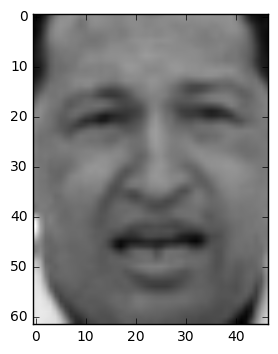

predicted:  Hugo Chavez  actual:  Hugo Chavez


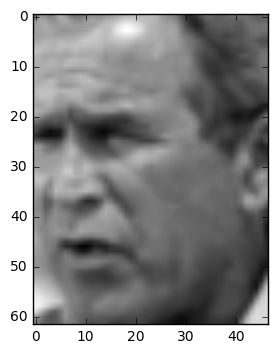

predicted:  Colin Powell  actual:  George W Bush


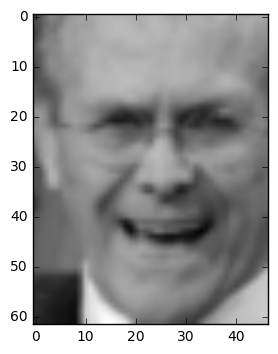

predicted:  Donald Rumsfeld  actual:  Donald Rumsfeld


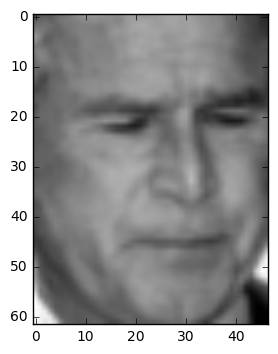

predicted:  George W Bush  actual:  George W Bush


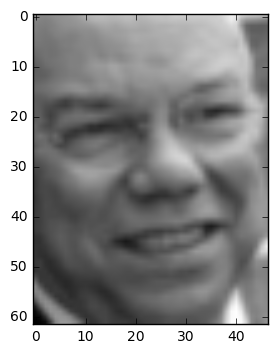

predicted:  Colin Powell  actual:  Colin Powell


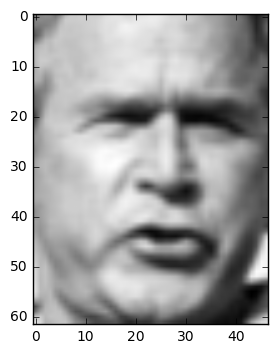

predicted:  George W Bush  actual:  George W Bush


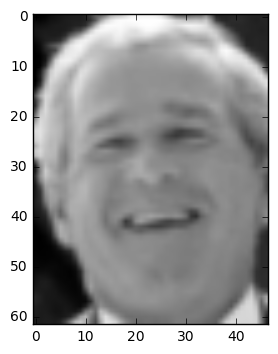

predicted:  Hugo Chavez  actual:  George W Bush


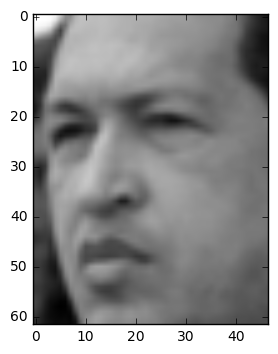

predicted:  Colin Powell  actual:  Hugo Chavez


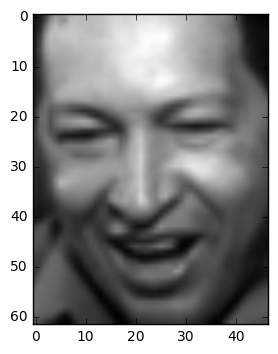

predicted:  Tony Blair  actual:  Hugo Chavez


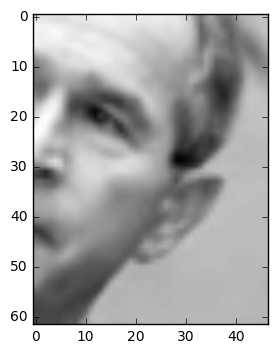

predicted:  Colin Powell  actual:  George W Bush


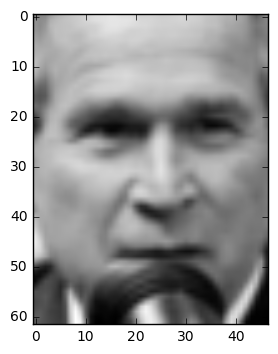

predicted:  George W Bush  actual:  George W Bush


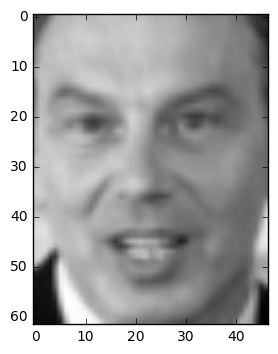

predicted:  Tony Blair  actual:  Tony Blair


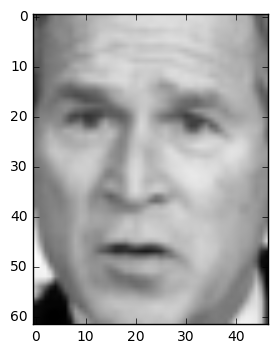

predicted:  George W Bush  actual:  George W Bush


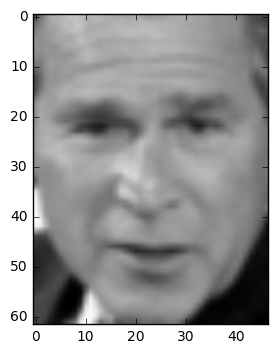

predicted:  George W Bush  actual:  George W Bush


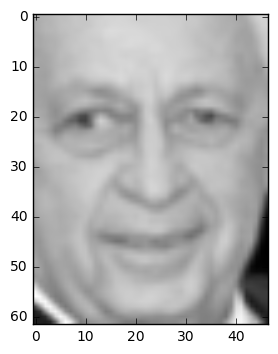

predicted:  Ariel Sharon  actual:  Ariel Sharon


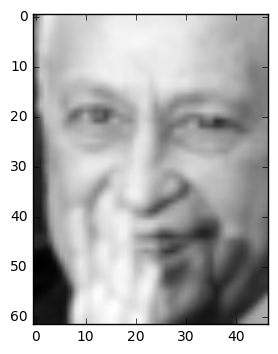

predicted:  Ariel Sharon  actual:  Ariel Sharon


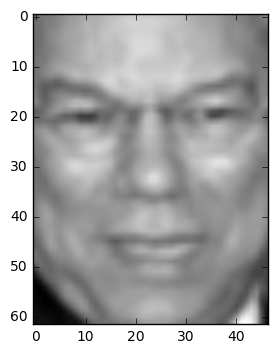

predicted:  Colin Powell  actual:  Colin Powell


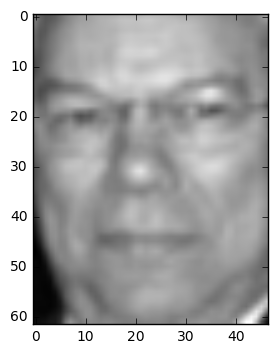

predicted:  Colin Powell  actual:  Colin Powell


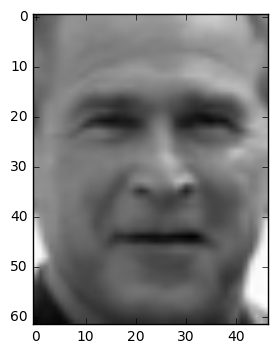

predicted:  George W Bush  actual:  George W Bush


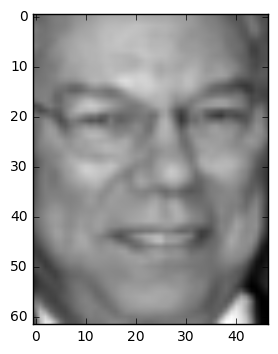

predicted:  Colin Powell  actual:  Colin Powell


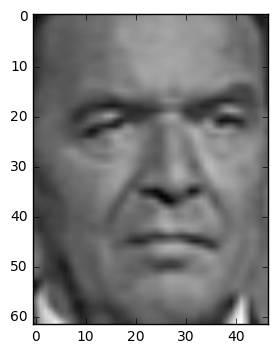

predicted:  George W Bush  actual:  Gerhard Schroeder


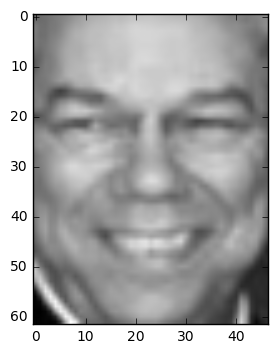

predicted:  Colin Powell  actual:  Colin Powell


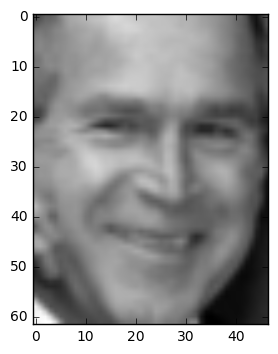

predicted:  George W Bush  actual:  George W Bush


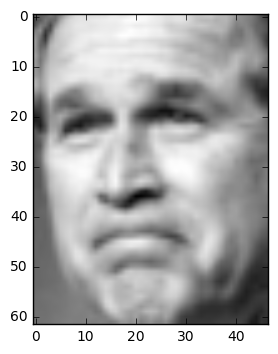

predicted:  George W Bush  actual:  George W Bush


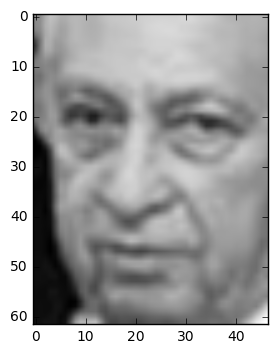

predicted:  Ariel Sharon  actual:  Ariel Sharon


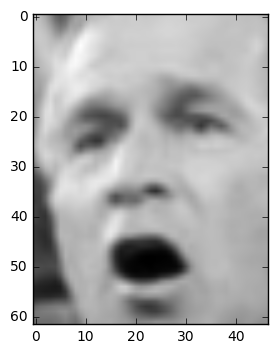

predicted:  George W Bush  actual:  George W Bush


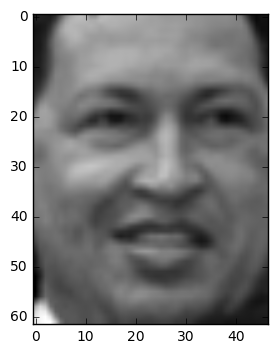

predicted:  Hugo Chavez  actual:  Hugo Chavez


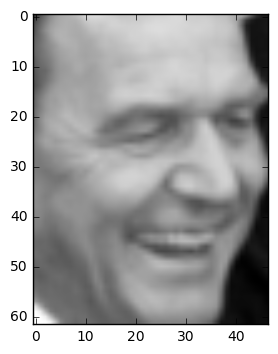

predicted:  Tony Blair  actual:  Gerhard Schroeder


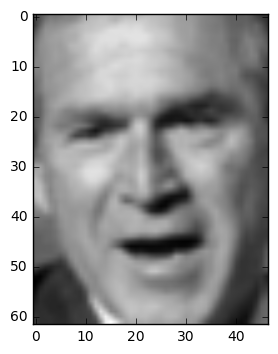

predicted:  George W Bush  actual:  George W Bush


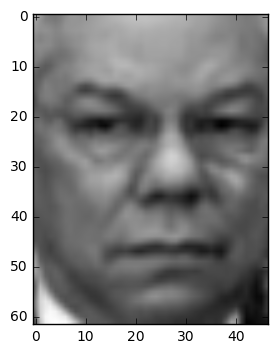

predicted:  Colin Powell  actual:  Colin Powell


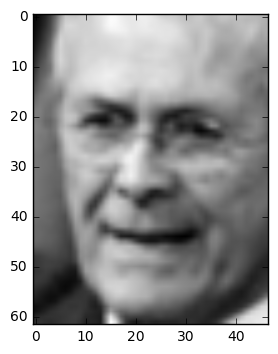

predicted:  Donald Rumsfeld  actual:  Donald Rumsfeld


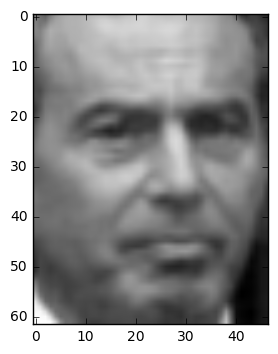

predicted:  Tony Blair  actual:  Tony Blair


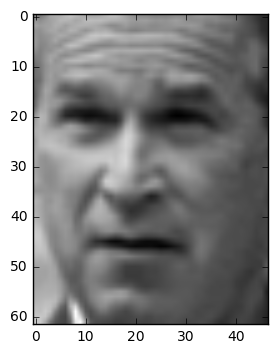

predicted:  George W Bush  actual:  George W Bush


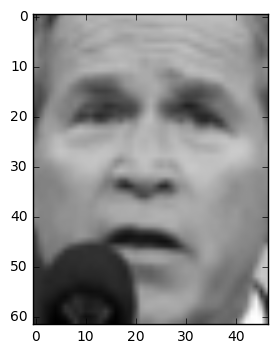

predicted:  George W Bush  actual:  George W Bush


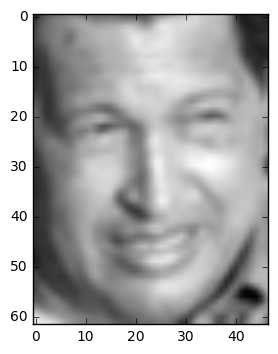

predicted:  Hugo Chavez  actual:  Hugo Chavez


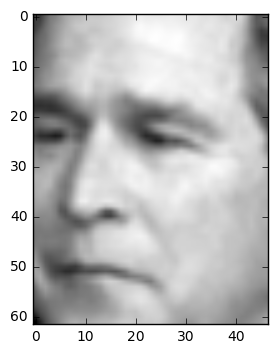

predicted:  George W Bush  actual:  George W Bush


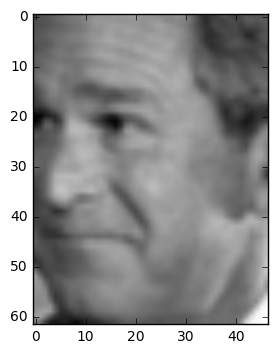

predicted:  George W Bush  actual:  George W Bush


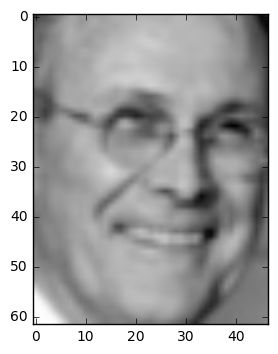

predicted:  George W Bush  actual:  Donald Rumsfeld


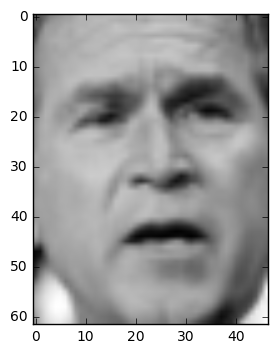

predicted:  George W Bush  actual:  George W Bush


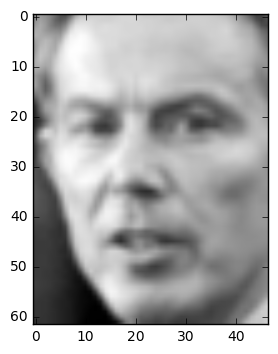

predicted:  George W Bush  actual:  Tony Blair


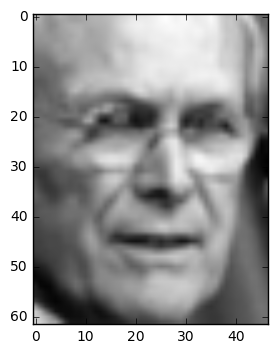

predicted:  Donald Rumsfeld  actual:  Donald Rumsfeld


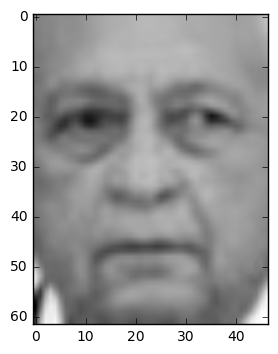

predicted:  Ariel Sharon  actual:  Ariel Sharon


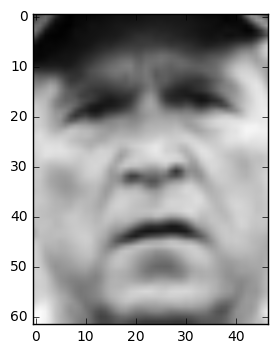

predicted:  Hugo Chavez  actual:  George W Bush


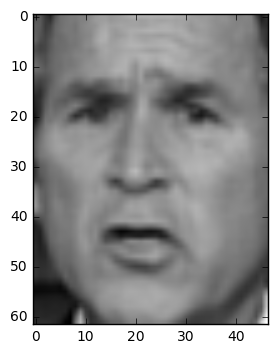

predicted:  George W Bush  actual:  George W Bush


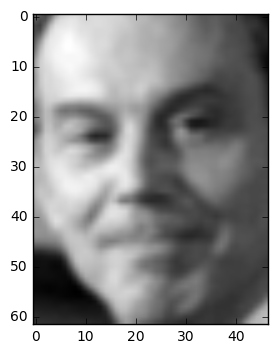

predicted:  Colin Powell  actual:  Tony Blair


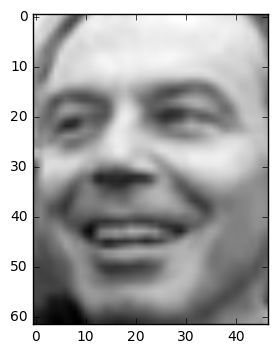

predicted:  Colin Powell  actual:  Tony Blair


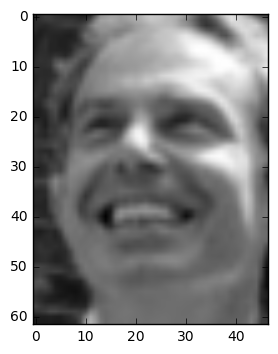

predicted:  Donald Rumsfeld  actual:  Tony Blair


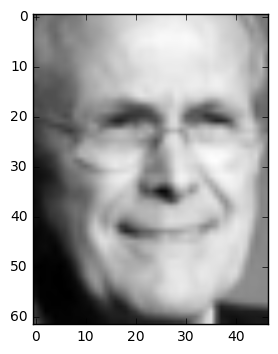

predicted:  Donald Rumsfeld  actual:  Donald Rumsfeld


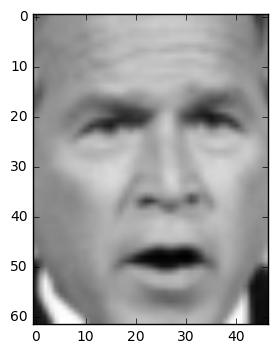

predicted:  George W Bush  actual:  George W Bush


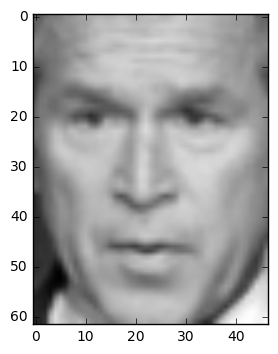

predicted:  George W Bush  actual:  George W Bush


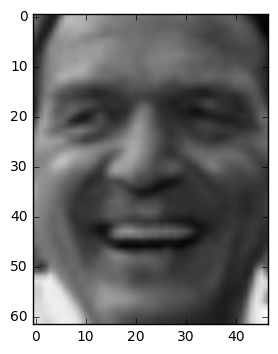

predicted:  Gerhard Schroeder  actual:  Gerhard Schroeder


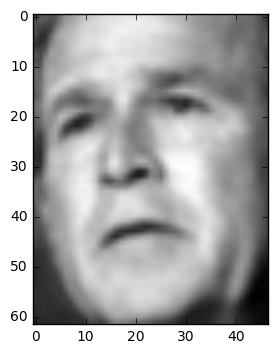

predicted:  George W Bush  actual:  George W Bush


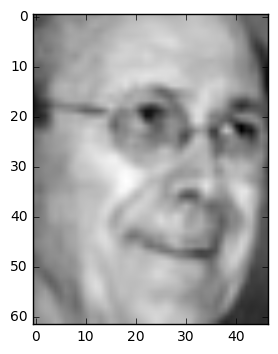

predicted:  George W Bush  actual:  Donald Rumsfeld


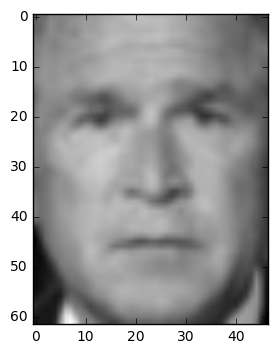

predicted:  George W Bush  actual:  George W Bush


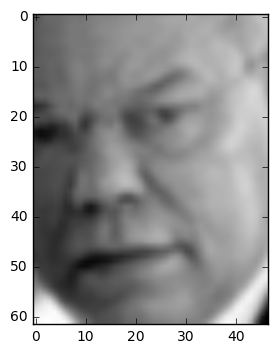

predicted:  Colin Powell  actual:  Colin Powell


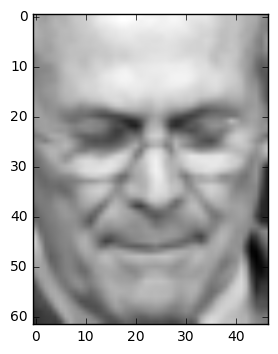

predicted:  Donald Rumsfeld  actual:  Donald Rumsfeld


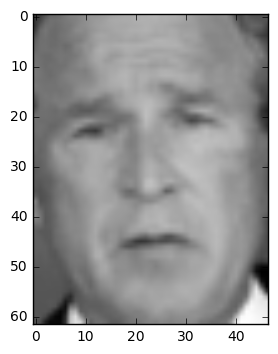

predicted:  George W Bush  actual:  George W Bush


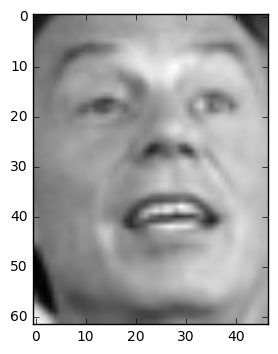

predicted:  Gerhard Schroeder  actual:  Tony Blair


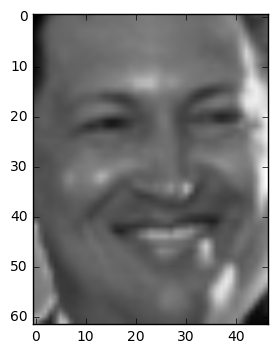

predicted:  Hugo Chavez  actual:  Hugo Chavez


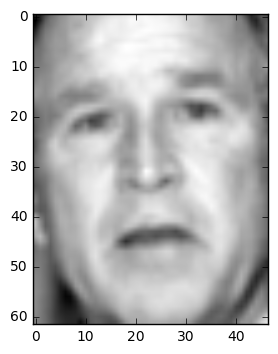

predicted:  George W Bush  actual:  George W Bush


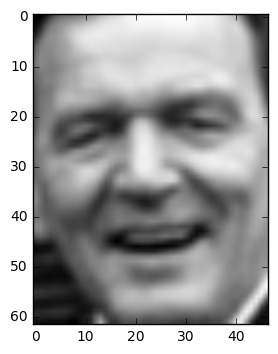

predicted:  Gerhard Schroeder  actual:  Gerhard Schroeder


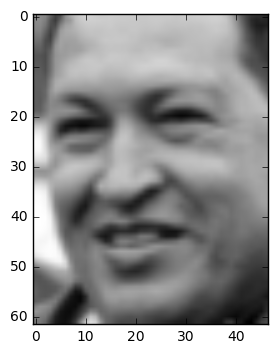

predicted:  Hugo Chavez  actual:  Hugo Chavez


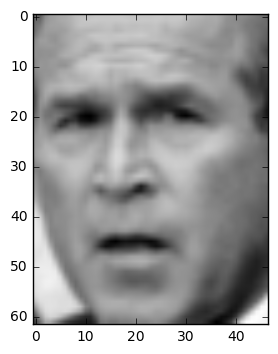

predicted:  George W Bush  actual:  George W Bush


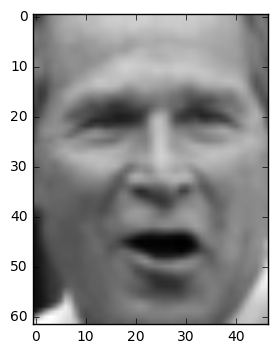

predicted:  George W Bush  actual:  George W Bush


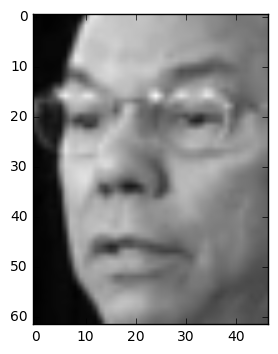

predicted:  Colin Powell  actual:  Colin Powell


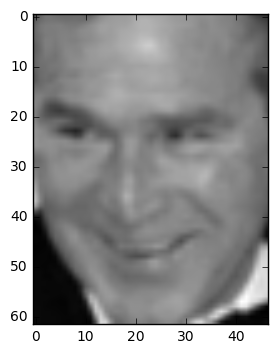

predicted:  Colin Powell  actual:  George W Bush


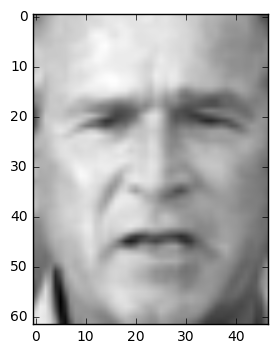

predicted:  George W Bush  actual:  George W Bush


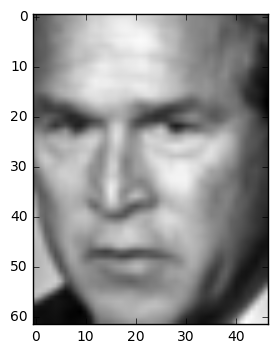

predicted:  George W Bush  actual:  George W Bush


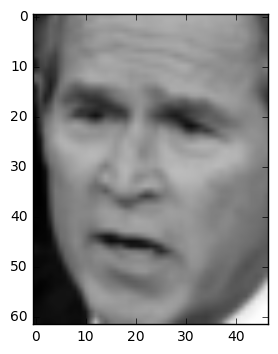

predicted:  George W Bush  actual:  George W Bush


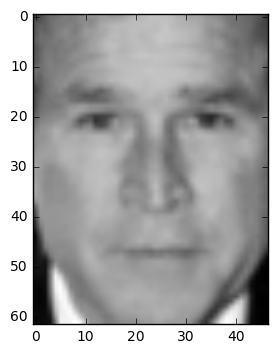

predicted:  George W Bush  actual:  George W Bush


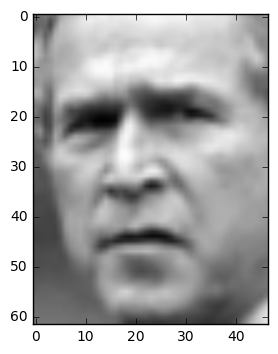

predicted:  George W Bush  actual:  George W Bush


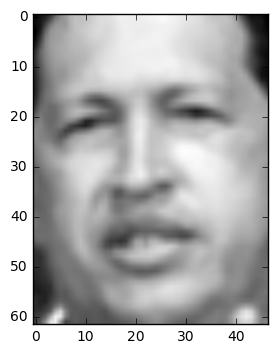

predicted:  Hugo Chavez  actual:  Hugo Chavez


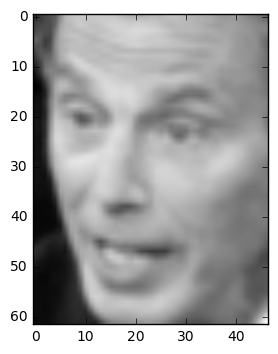

predicted:  Tony Blair  actual:  Tony Blair


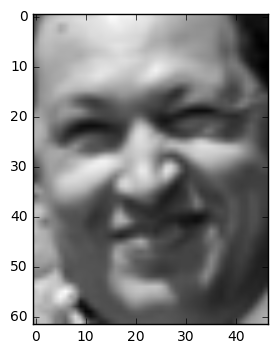

predicted:  Hugo Chavez  actual:  Hugo Chavez


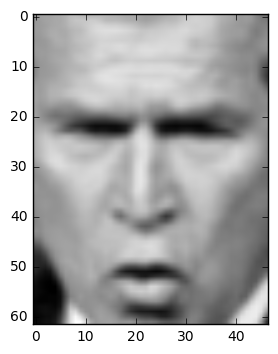

predicted:  George W Bush  actual:  George W Bush


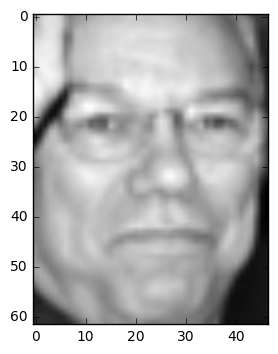

predicted:  Colin Powell  actual:  Colin Powell


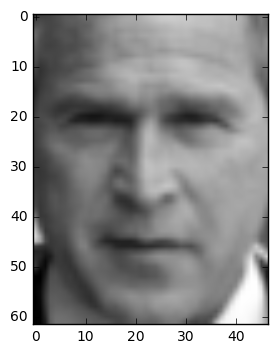

predicted:  George W Bush  actual:  George W Bush


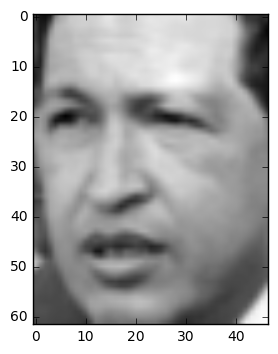

predicted:  Gerhard Schroeder  actual:  Hugo Chavez


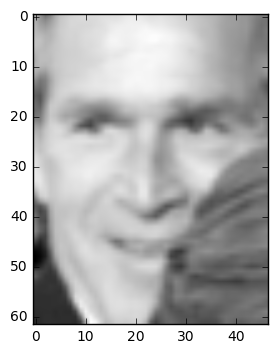

predicted:  Tony Blair  actual:  George W Bush


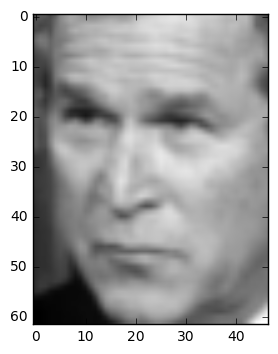

predicted:  George W Bush  actual:  George W Bush


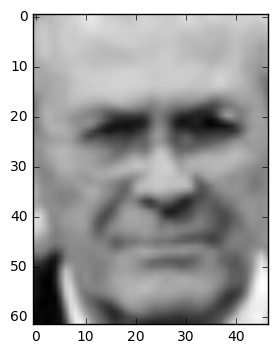

predicted:  Donald Rumsfeld  actual:  Donald Rumsfeld


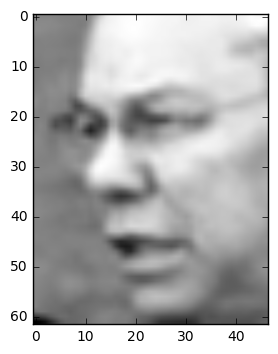

predicted:  Colin Powell  actual:  Colin Powell


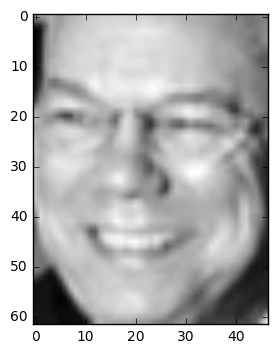

predicted:  Colin Powell  actual:  Colin Powell


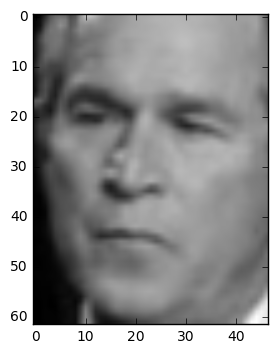

predicted:  George W Bush  actual:  George W Bush


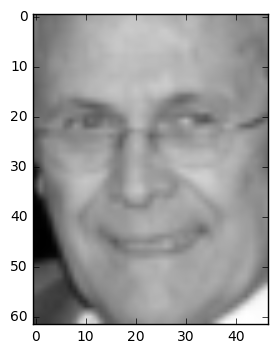

predicted:  Donald Rumsfeld  actual:  Donald Rumsfeld


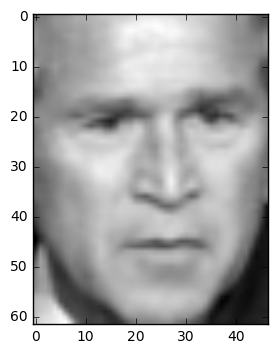

predicted:  George W Bush  actual:  George W Bush


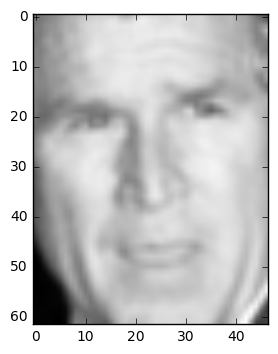

predicted:  George W Bush  actual:  George W Bush


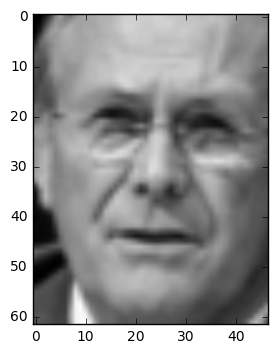

predicted:  Donald Rumsfeld  actual:  Donald Rumsfeld


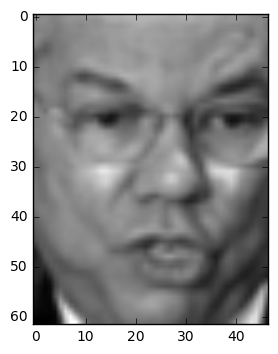

predicted:  Colin Powell  actual:  Colin Powell


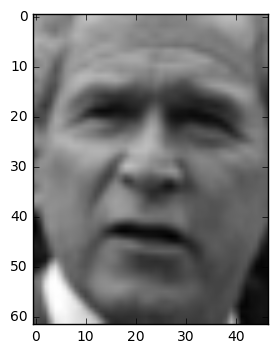

predicted:  George W Bush  actual:  George W Bush


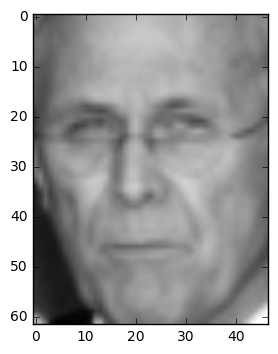

predicted:  George W Bush  actual:  Donald Rumsfeld


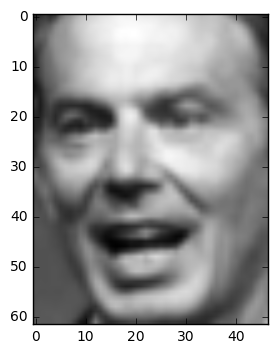

predicted:  Tony Blair  actual:  Tony Blair


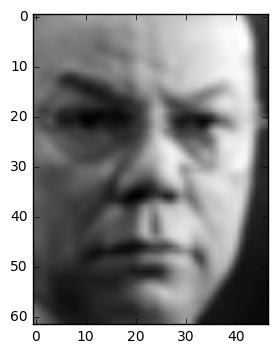

predicted:  Colin Powell  actual:  Colin Powell


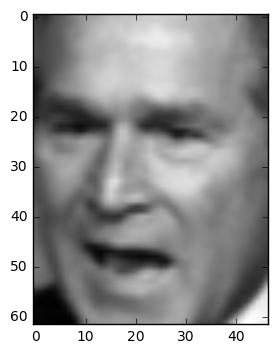

predicted:  George W Bush  actual:  George W Bush


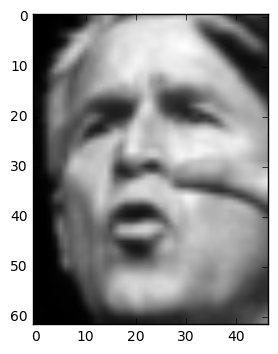

predicted:  George W Bush  actual:  George W Bush


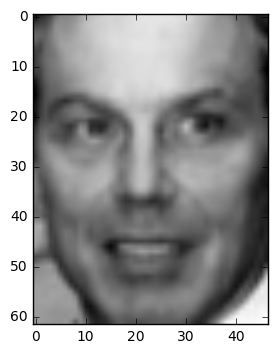

predicted:  Tony Blair  actual:  Tony Blair


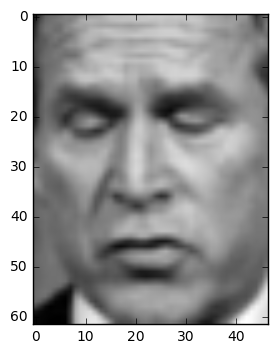

predicted:  George W Bush  actual:  George W Bush


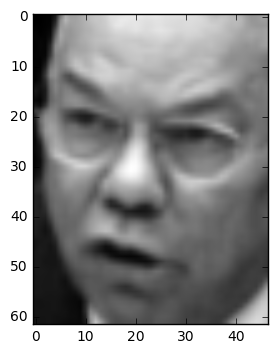

predicted:  Colin Powell  actual:  Colin Powell


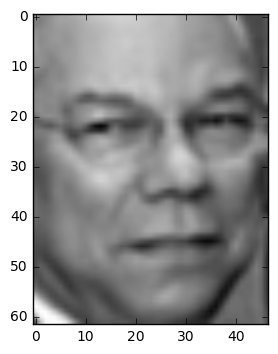

predicted:  Colin Powell  actual:  Colin Powell


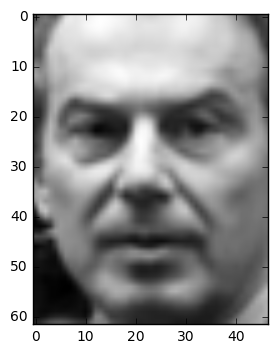

predicted:  Tony Blair  actual:  Tony Blair


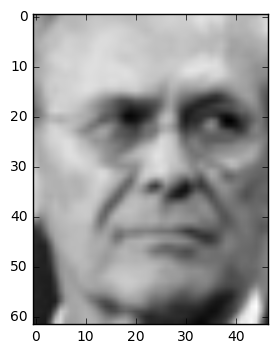

predicted:  Donald Rumsfeld  actual:  Donald Rumsfeld


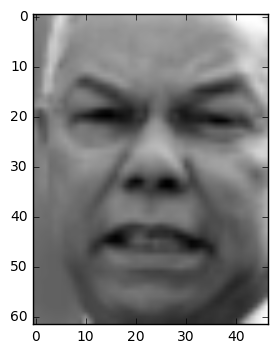

predicted:  Colin Powell  actual:  Colin Powell


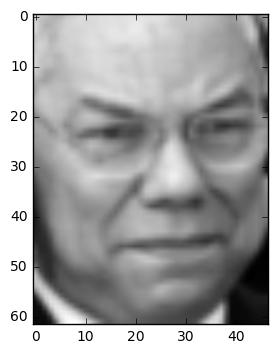

predicted:  Colin Powell  actual:  Colin Powell


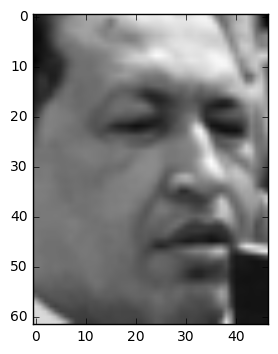

predicted:  George W Bush  actual:  Hugo Chavez


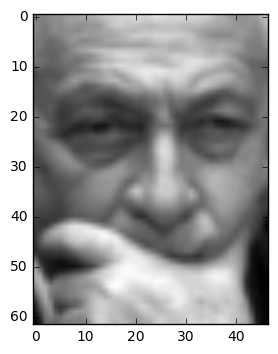

predicted:  Donald Rumsfeld  actual:  Ariel Sharon


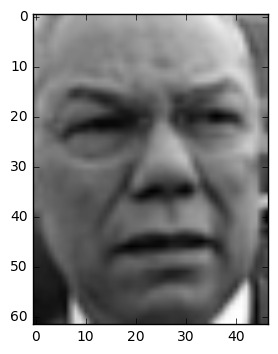

predicted:  Colin Powell  actual:  Colin Powell


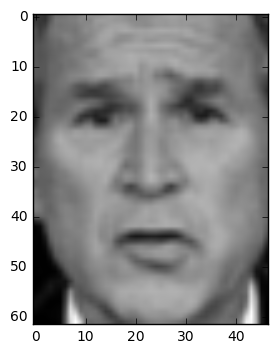

predicted:  George W Bush  actual:  George W Bush


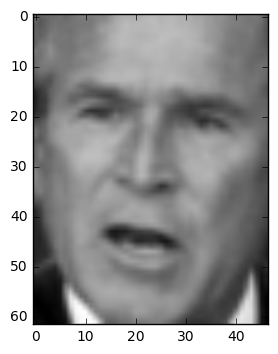

predicted:  George W Bush  actual:  George W Bush


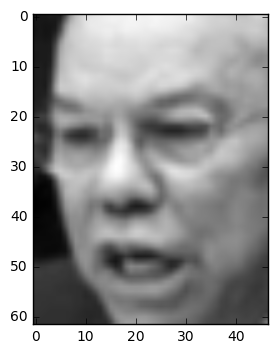

predicted:  Colin Powell  actual:  Colin Powell


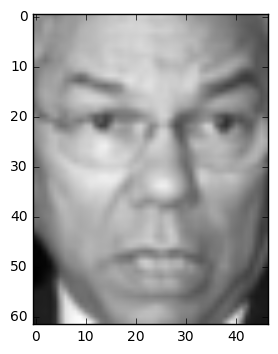

predicted:  Colin Powell  actual:  Colin Powell


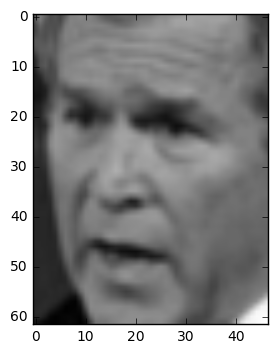

predicted:  George W Bush  actual:  George W Bush


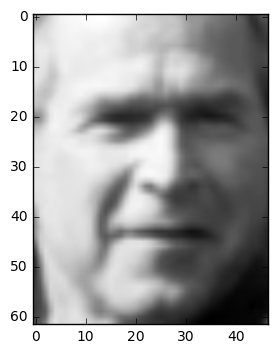

predicted:  George W Bush  actual:  George W Bush


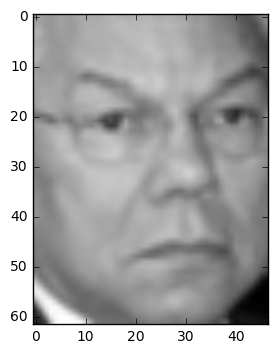

predicted:  George W Bush  actual:  Colin Powell


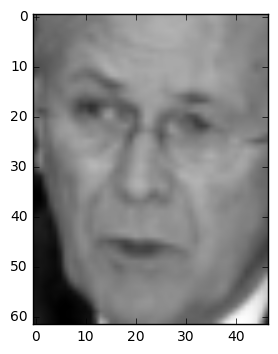

predicted:  George W Bush  actual:  Donald Rumsfeld


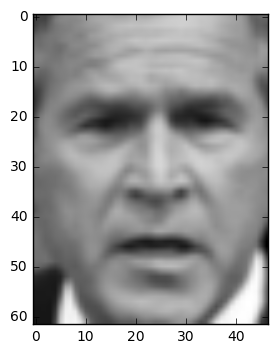

predicted:  George W Bush  actual:  George W Bush


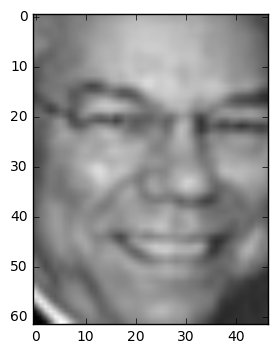

predicted:  Colin Powell  actual:  Colin Powell


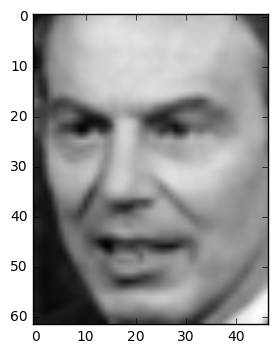

predicted:  Tony Blair  actual:  Tony Blair


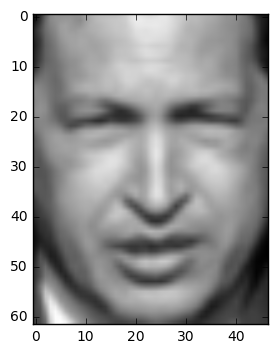

predicted:  Hugo Chavez  actual:  Hugo Chavez


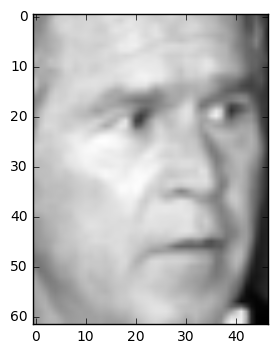

predicted:  George W Bush  actual:  George W Bush


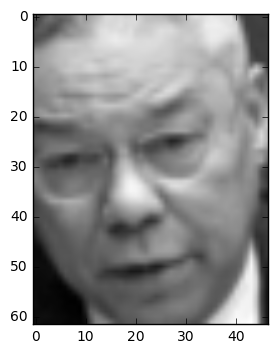

predicted:  Ariel Sharon  actual:  Colin Powell


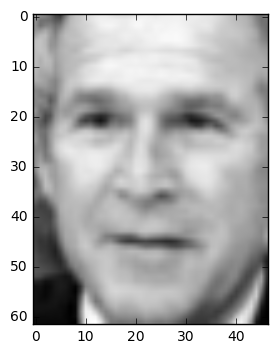

predicted:  George W Bush  actual:  George W Bush


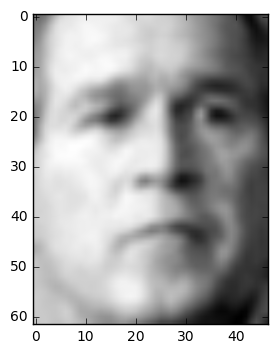

predicted:  George W Bush  actual:  George W Bush


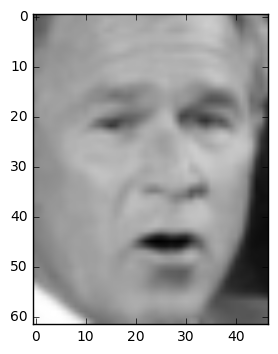

predicted:  George W Bush  actual:  George W Bush


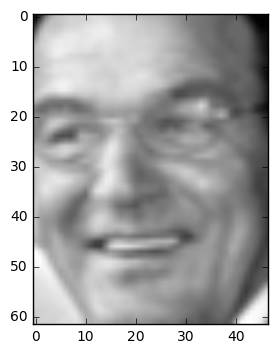

predicted:  Tony Blair  actual:  Gerhard Schroeder


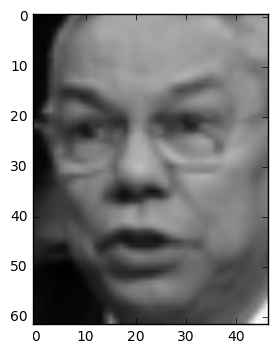

predicted:  Colin Powell  actual:  Colin Powell


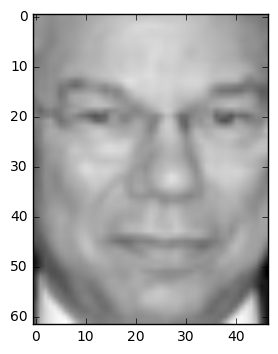

predicted:  Colin Powell  actual:  Colin Powell


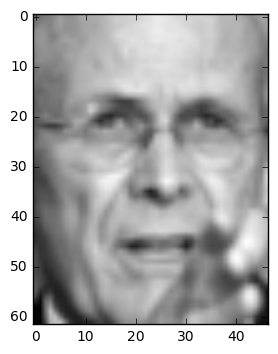

predicted:  Donald Rumsfeld  actual:  Donald Rumsfeld


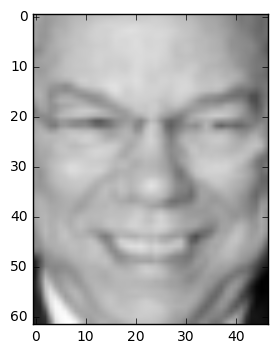

predicted:  Colin Powell  actual:  Colin Powell


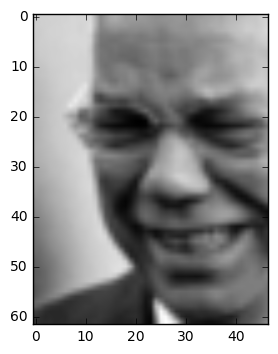

predicted:  George W Bush  actual:  Colin Powell


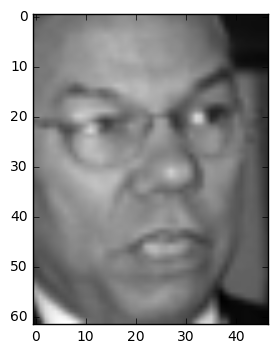

predicted:  Colin Powell  actual:  Colin Powell


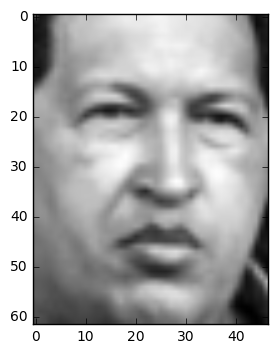

predicted:  Hugo Chavez  actual:  Hugo Chavez


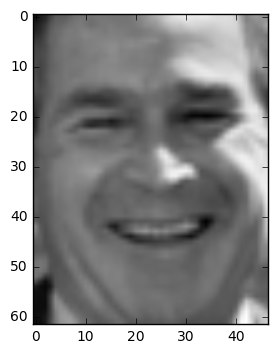

predicted:  George W Bush  actual:  George W Bush


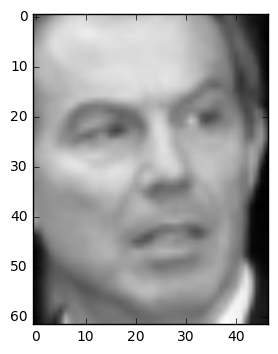

predicted:  Tony Blair  actual:  Tony Blair


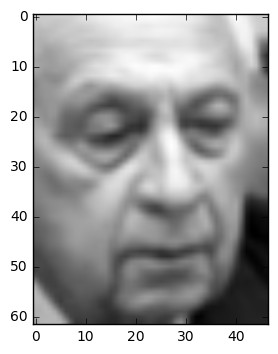

predicted:  Ariel Sharon  actual:  Ariel Sharon


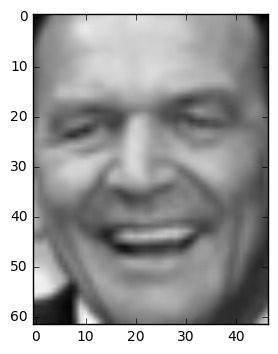

predicted:  Gerhard Schroeder  actual:  Gerhard Schroeder


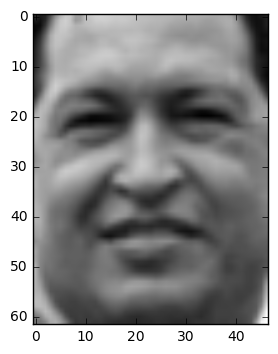

predicted:  Hugo Chavez  actual:  Hugo Chavez


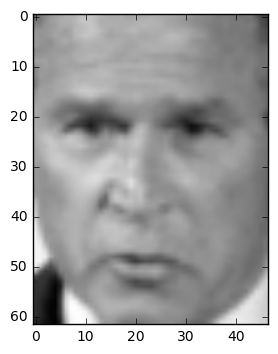

predicted:  George W Bush  actual:  George W Bush


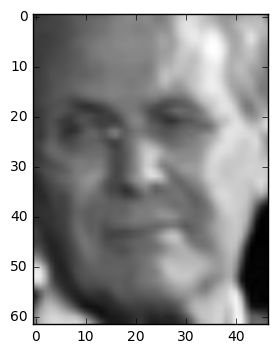

predicted:  Donald Rumsfeld  actual:  Donald Rumsfeld


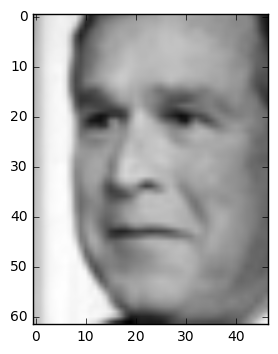

predicted:  Ariel Sharon  actual:  George W Bush


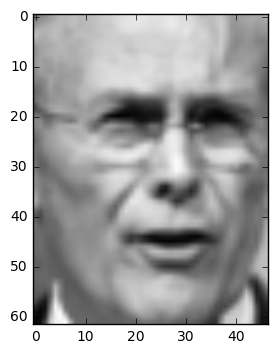

predicted:  Donald Rumsfeld  actual:  Donald Rumsfeld


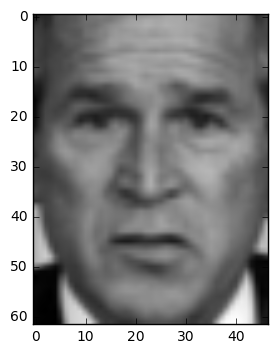

predicted:  George W Bush  actual:  George W Bush


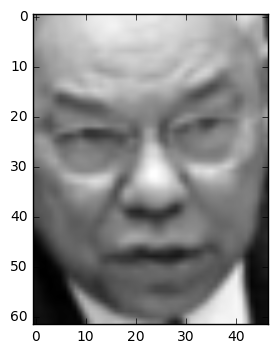

predicted:  Colin Powell  actual:  Colin Powell


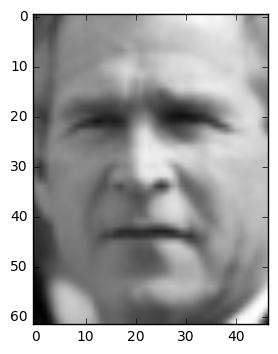

predicted:  George W Bush  actual:  George W Bush


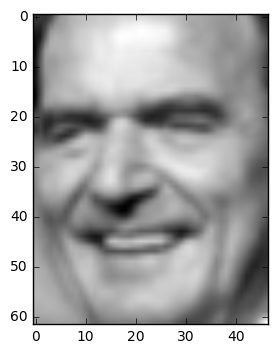

predicted:  Gerhard Schroeder  actual:  Gerhard Schroeder


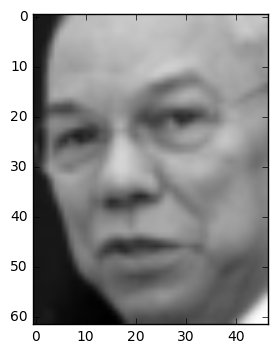

predicted:  Colin Powell  actual:  Colin Powell


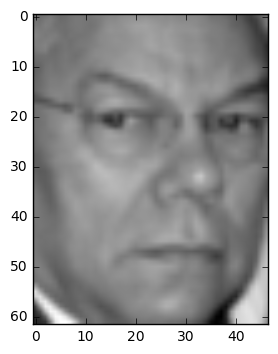

predicted:  George W Bush  actual:  Colin Powell


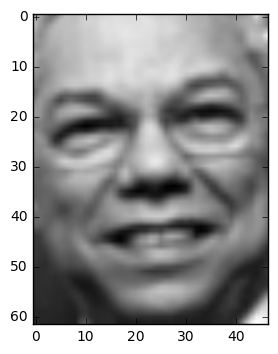

predicted:  Colin Powell  actual:  Colin Powell


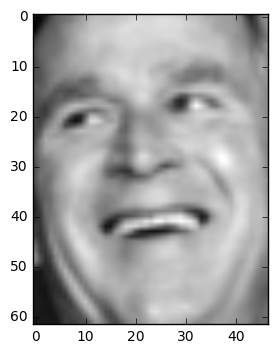

predicted:  George W Bush  actual:  George W Bush


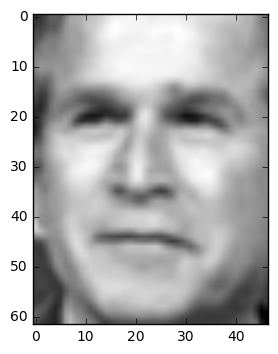

predicted:  George W Bush  actual:  George W Bush


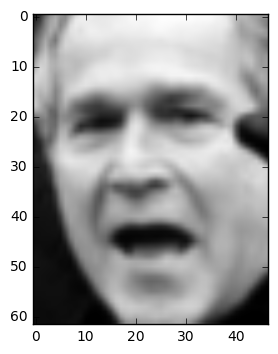

predicted:  George W Bush  actual:  George W Bush


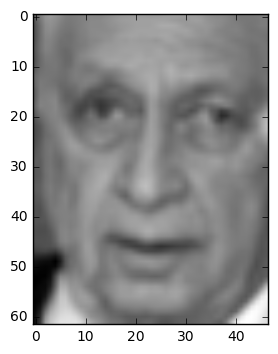

predicted:  Ariel Sharon  actual:  Ariel Sharon


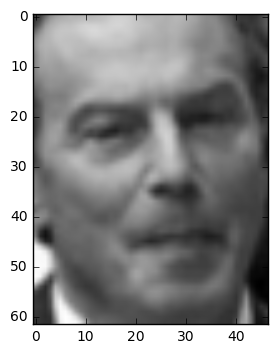

predicted:  Tony Blair  actual:  Tony Blair


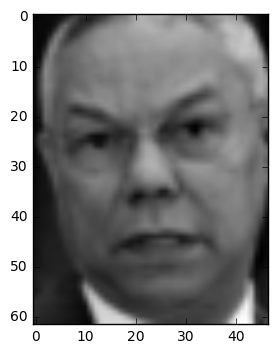

predicted:  Colin Powell  actual:  Colin Powell


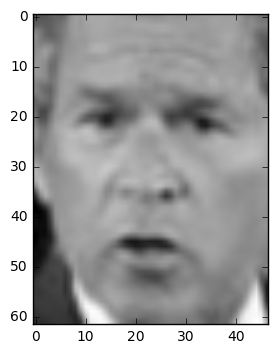

predicted:  George W Bush  actual:  George W Bush


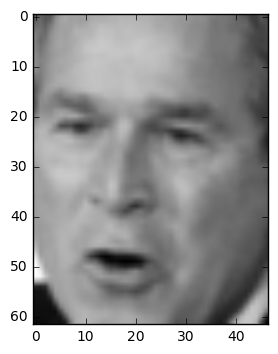

predicted:  George W Bush  actual:  George W Bush


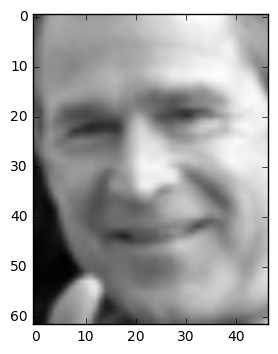

predicted:  George W Bush  actual:  George W Bush


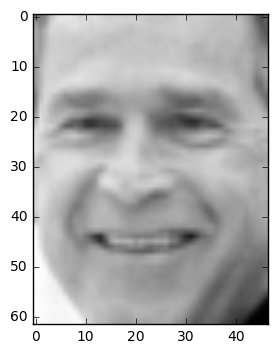

predicted:  George W Bush  actual:  George W Bush


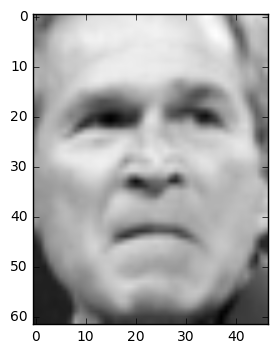

predicted:  George W Bush  actual:  George W Bush


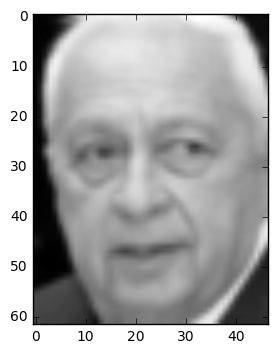

predicted:  Gerhard Schroeder  actual:  Ariel Sharon


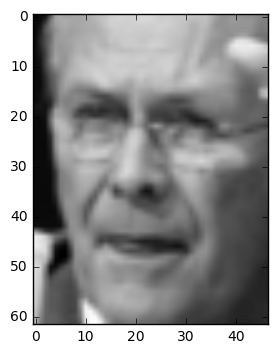

predicted:  George W Bush  actual:  Donald Rumsfeld


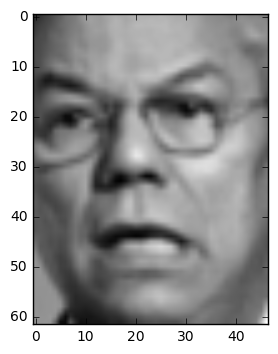

predicted:  Colin Powell  actual:  Colin Powell


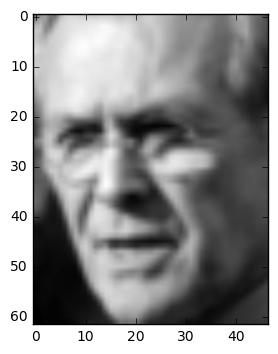

predicted:  Donald Rumsfeld  actual:  Donald Rumsfeld


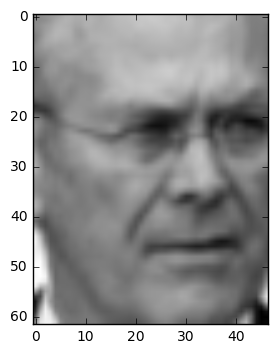

predicted:  George W Bush  actual:  Donald Rumsfeld


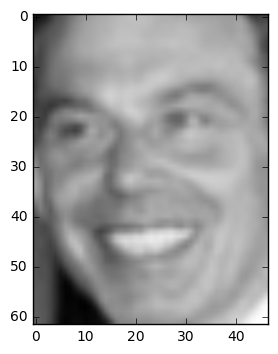

predicted:  Tony Blair  actual:  Tony Blair


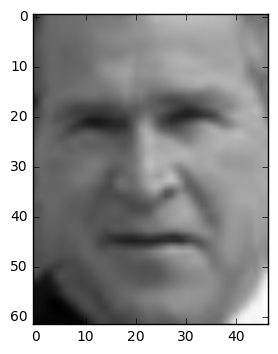

predicted:  George W Bush  actual:  George W Bush


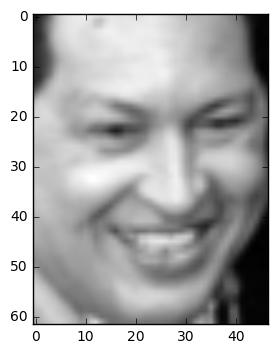

predicted:  Hugo Chavez  actual:  Hugo Chavez


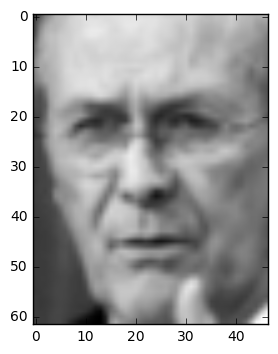

predicted:  Donald Rumsfeld  actual:  Donald Rumsfeld


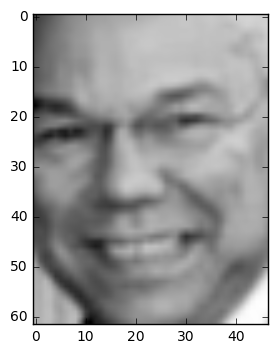

predicted:  Colin Powell  actual:  Colin Powell


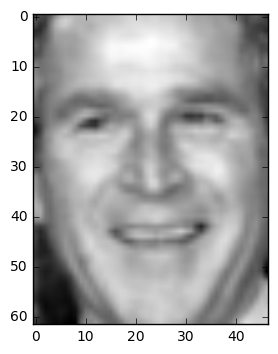

predicted:  George W Bush  actual:  George W Bush


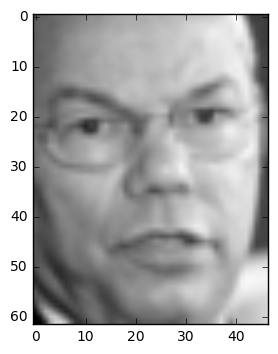

predicted:  Colin Powell  actual:  Colin Powell


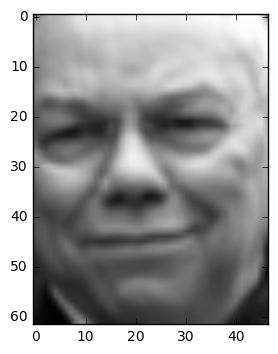

predicted:  Colin Powell  actual:  Colin Powell


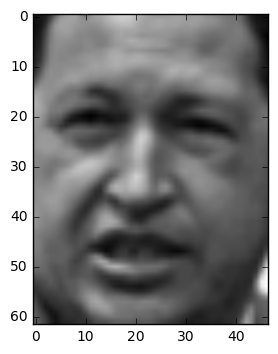

predicted:  Hugo Chavez  actual:  Hugo Chavez


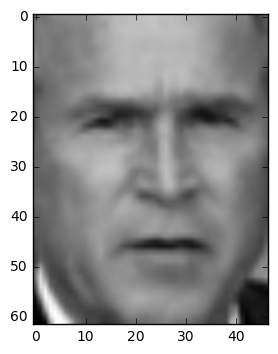

predicted:  George W Bush  actual:  George W Bush


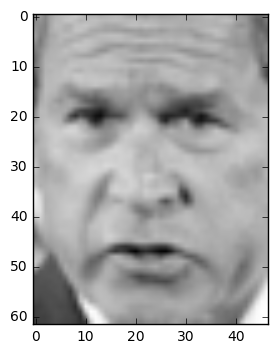

predicted:  George W Bush  actual:  George W Bush


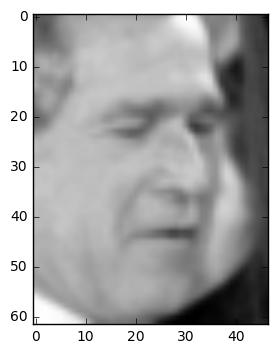

predicted:  George W Bush  actual:  George W Bush


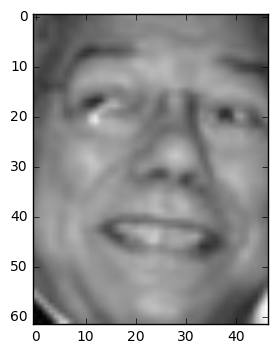

predicted:  George W Bush  actual:  Colin Powell


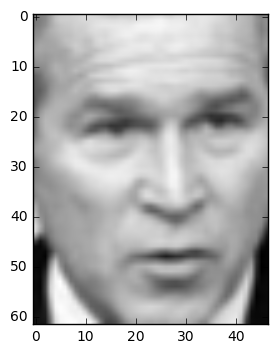

predicted:  George W Bush  actual:  George W Bush


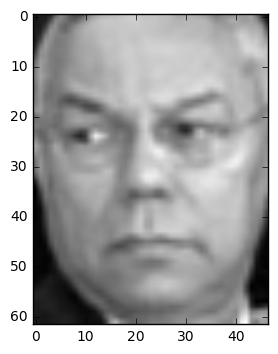

predicted:  Colin Powell  actual:  Colin Powell


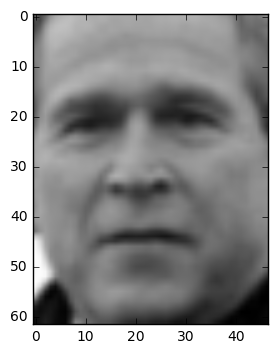

predicted:  George W Bush  actual:  George W Bush


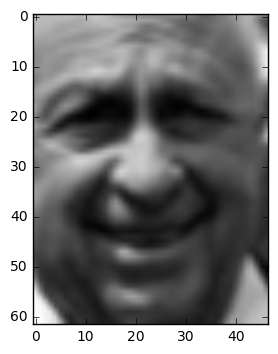

predicted:  Ariel Sharon  actual:  Ariel Sharon


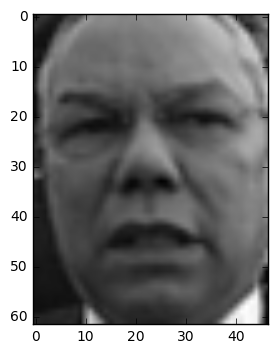

predicted:  Colin Powell  actual:  Colin Powell


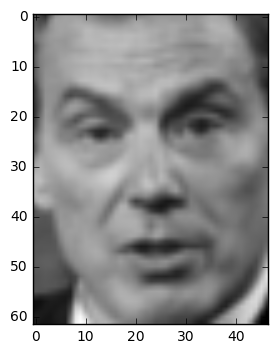

predicted:  Tony Blair  actual:  Tony Blair


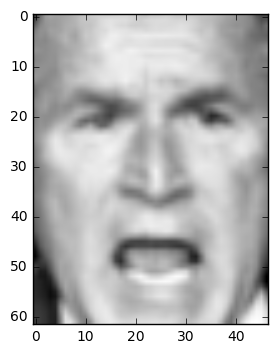

predicted:  George W Bush  actual:  George W Bush


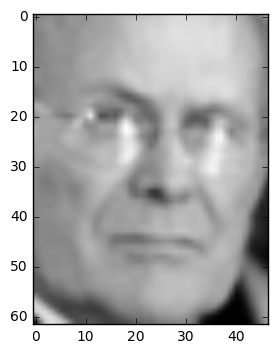

predicted:  George W Bush  actual:  Donald Rumsfeld


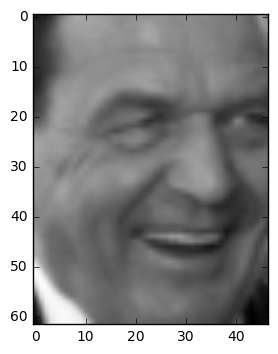

predicted:  Gerhard Schroeder  actual:  Gerhard Schroeder


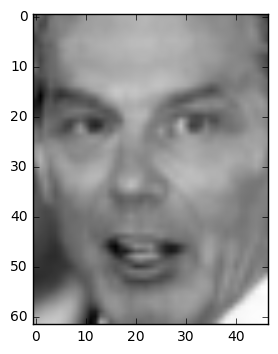

predicted:  Tony Blair  actual:  Tony Blair


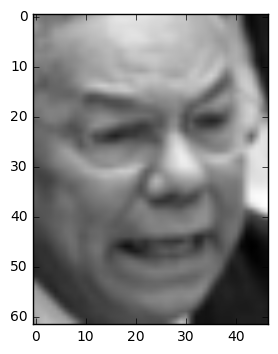

predicted:  Colin Powell  actual:  Colin Powell


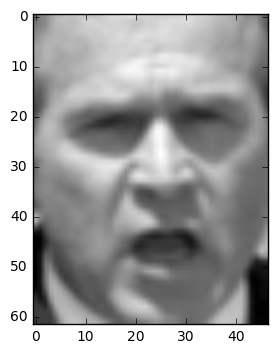

predicted:  George W Bush  actual:  George W Bush


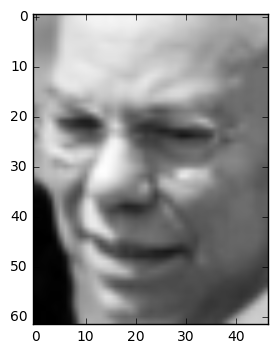

predicted:  Colin Powell  actual:  Colin Powell


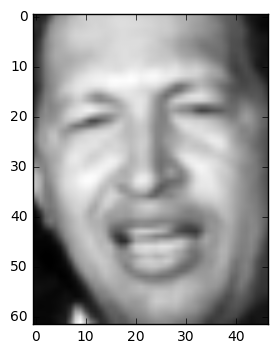

predicted:  Hugo Chavez  actual:  Hugo Chavez


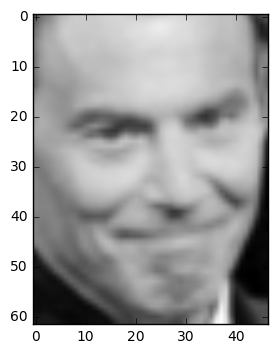

predicted:  George W Bush  actual:  Tony Blair


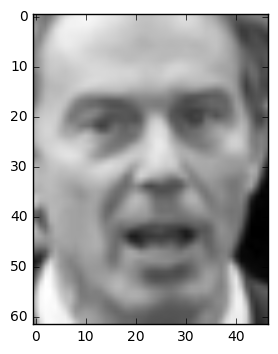

predicted:  Tony Blair  actual:  Tony Blair


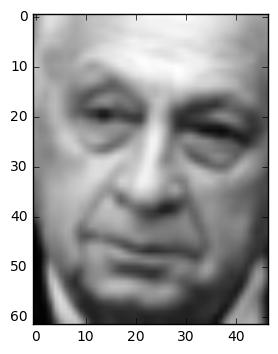

predicted:  Ariel Sharon  actual:  Ariel Sharon


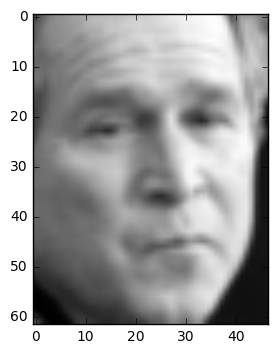

predicted:  George W Bush  actual:  George W Bush


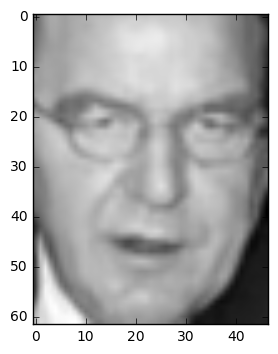

predicted:  Gerhard Schroeder  actual:  Gerhard Schroeder


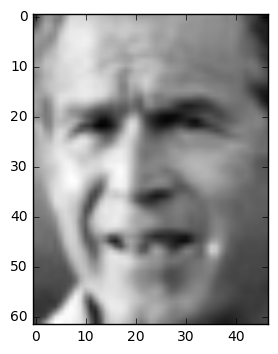

predicted:  George W Bush  actual:  George W Bush


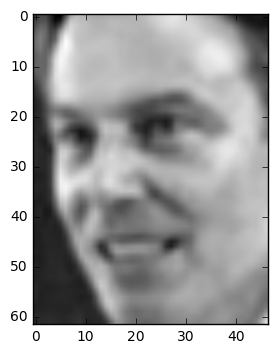

predicted:  Tony Blair  actual:  Tony Blair


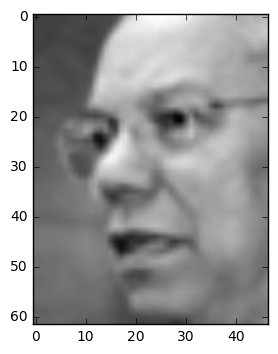

predicted:  George W Bush  actual:  Colin Powell


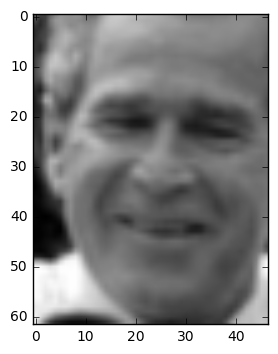

predicted:  Donald Rumsfeld  actual:  George W Bush


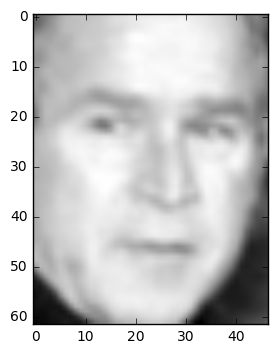

predicted:  George W Bush  actual:  George W Bush


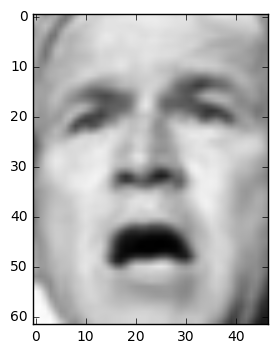

predicted:  George W Bush  actual:  George W Bush


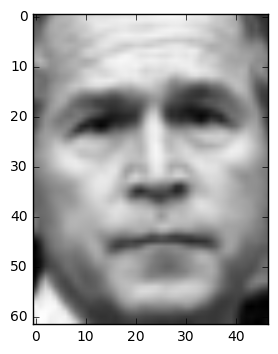

predicted:  George W Bush  actual:  George W Bush


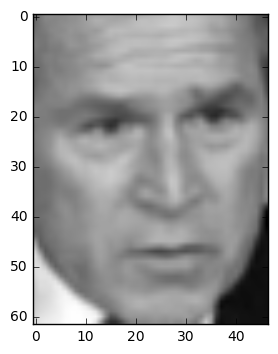

predicted:  George W Bush  actual:  George W Bush


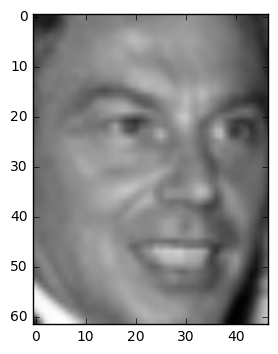

predicted:  George W Bush  actual:  Tony Blair


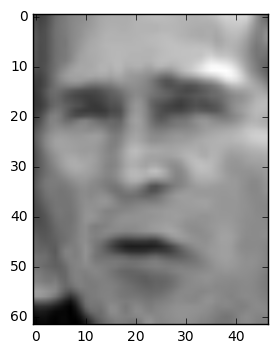

predicted:  George W Bush  actual:  George W Bush


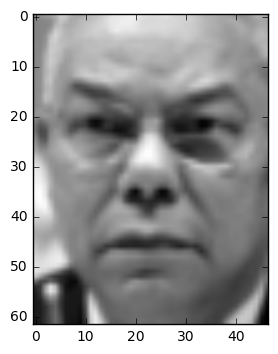

predicted:  Colin Powell  actual:  Colin Powell


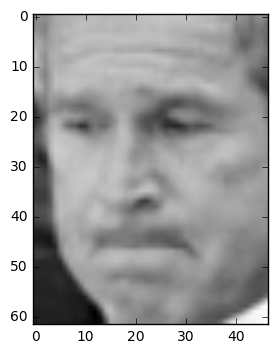

predicted:  George W Bush  actual:  George W Bush


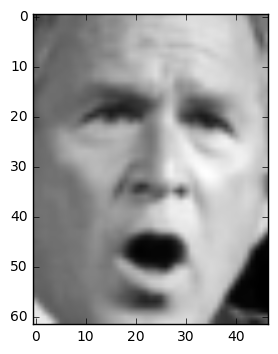

predicted:  George W Bush  actual:  George W Bush


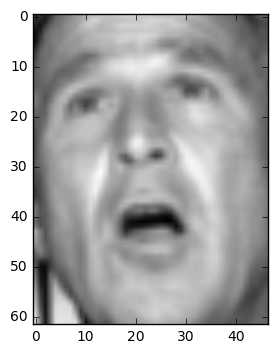

predicted:  George W Bush  actual:  George W Bush


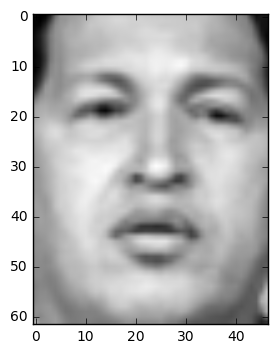

predicted:  Hugo Chavez  actual:  Hugo Chavez


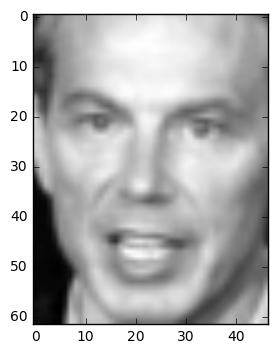

predicted:  Tony Blair  actual:  Tony Blair


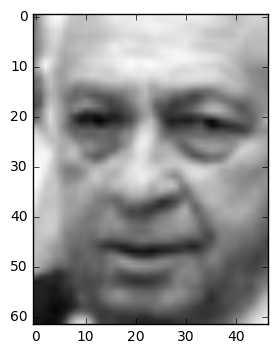

predicted:  Ariel Sharon  actual:  Ariel Sharon


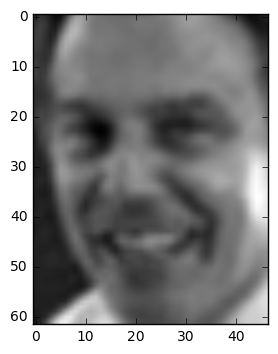

predicted:  Tony Blair  actual:  Tony Blair


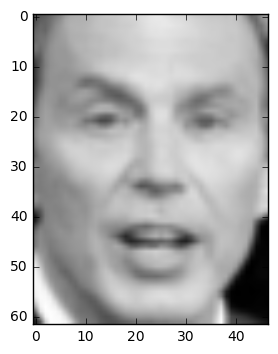

predicted:  Tony Blair  actual:  Tony Blair


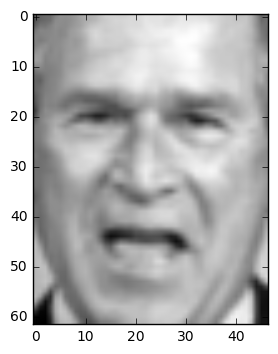

predicted:  George W Bush  actual:  George W Bush


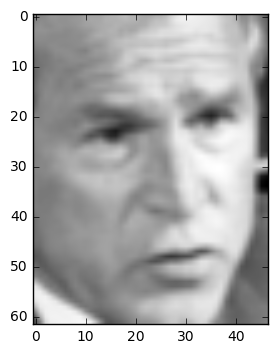

predicted:  George W Bush  actual:  George W Bush


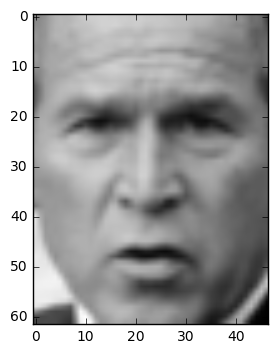

predicted:  George W Bush  actual:  George W Bush


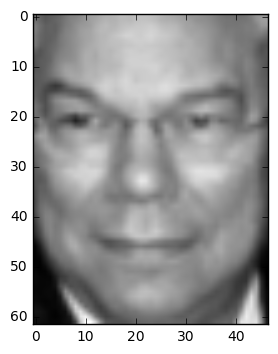

predicted:  Colin Powell  actual:  Colin Powell


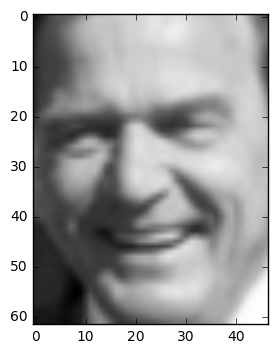

predicted:  Gerhard Schroeder  actual:  Gerhard Schroeder


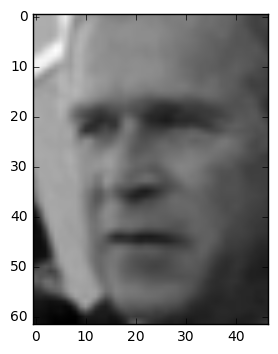

predicted:  George W Bush  actual:  George W Bush


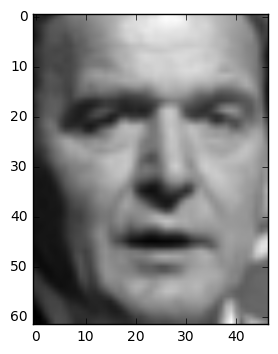

predicted:  Gerhard Schroeder  actual:  Gerhard Schroeder


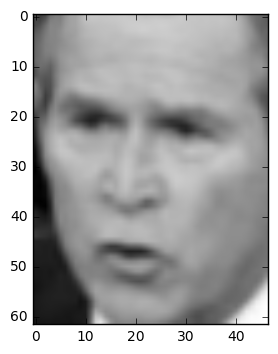

predicted:  George W Bush  actual:  George W Bush


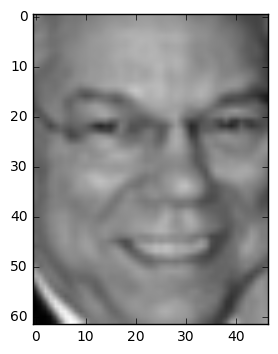

predicted:  Colin Powell  actual:  Colin Powell


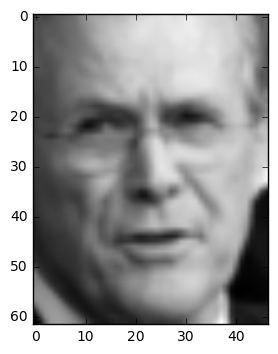

predicted:  Donald Rumsfeld  actual:  Donald Rumsfeld


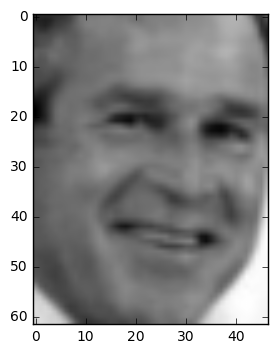

predicted:  George W Bush  actual:  George W Bush


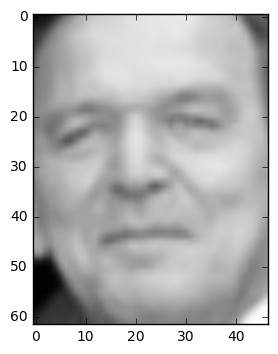

predicted:  Gerhard Schroeder  actual:  Gerhard Schroeder


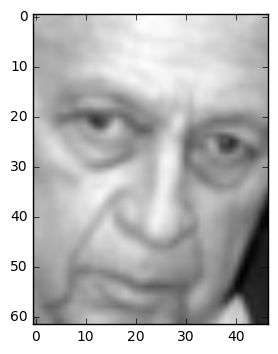

predicted:  Ariel Sharon  actual:  Ariel Sharon


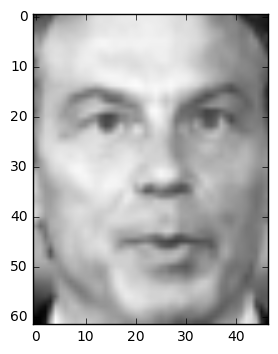

predicted:  Tony Blair  actual:  Tony Blair


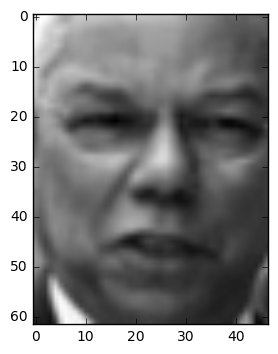

predicted:  Colin Powell  actual:  Colin Powell


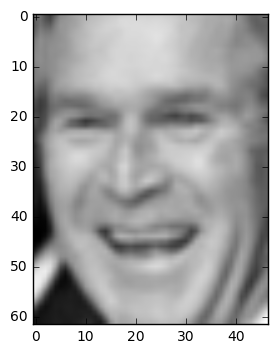

predicted:  George W Bush  actual:  George W Bush


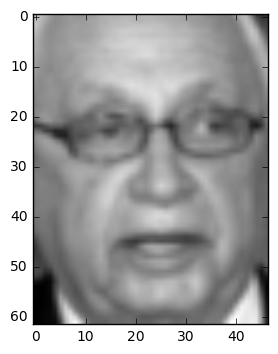

predicted:  Ariel Sharon  actual:  Ariel Sharon


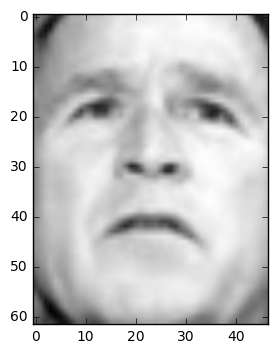

predicted:  George W Bush  actual:  George W Bush


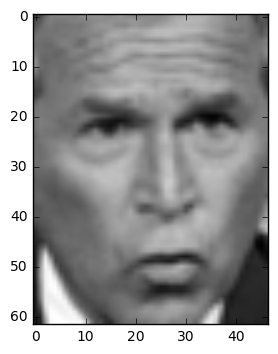

predicted:  George W Bush  actual:  George W Bush


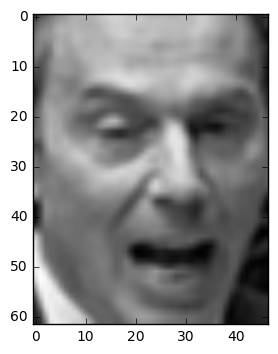

predicted:  Tony Blair  actual:  Tony Blair


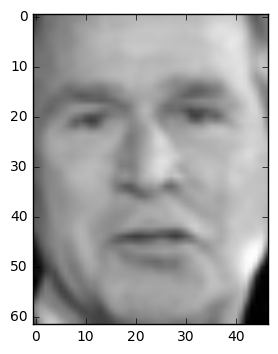

predicted:  George W Bush  actual:  George W Bush


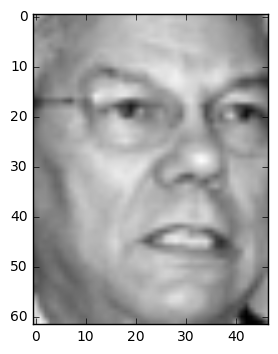

predicted:  George W Bush  actual:  Colin Powell


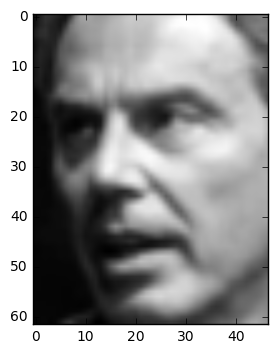

predicted:  Tony Blair  actual:  Tony Blair


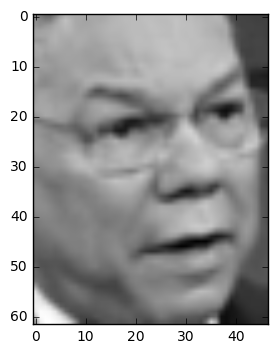

predicted:  George W Bush  actual:  Colin Powell


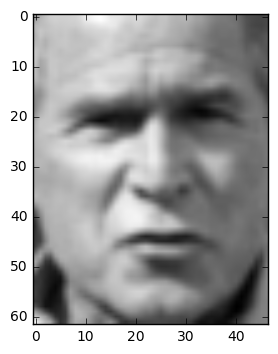

predicted:  George W Bush  actual:  George W Bush


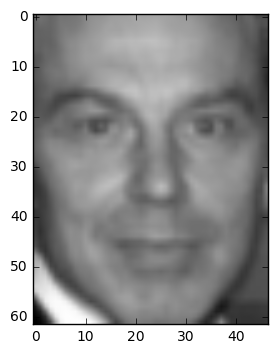

predicted:  Tony Blair  actual:  Tony Blair


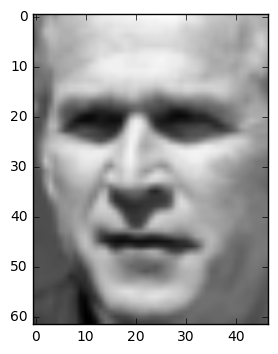

predicted:  George W Bush  actual:  George W Bush


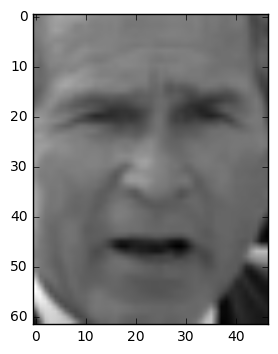

predicted:  George W Bush  actual:  George W Bush


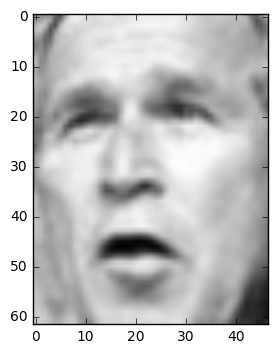

predicted:  George W Bush  actual:  George W Bush


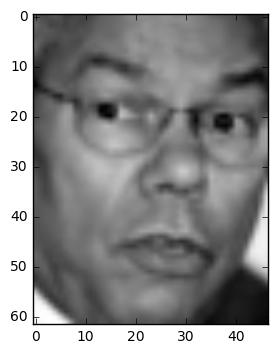

predicted:  George W Bush  actual:  Colin Powell


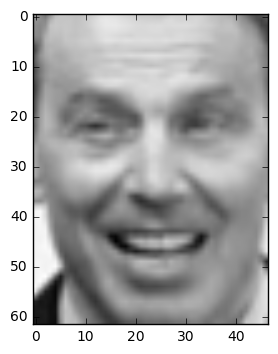

predicted:  Tony Blair  actual:  Tony Blair


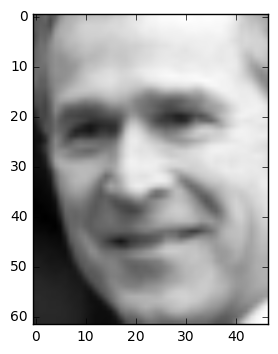

predicted:  George W Bush  actual:  George W Bush


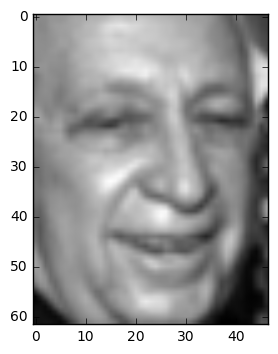

predicted:  Ariel Sharon  actual:  Ariel Sharon


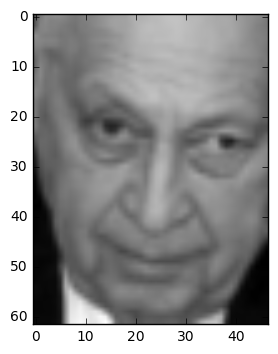

predicted:  Colin Powell  actual:  Ariel Sharon


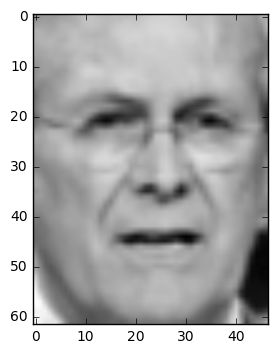

predicted:  Donald Rumsfeld  actual:  Donald Rumsfeld


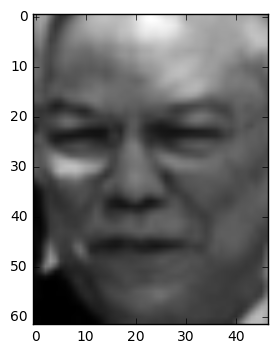

predicted:  Colin Powell  actual:  Colin Powell


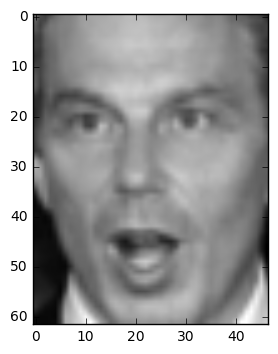

predicted:  Tony Blair  actual:  Tony Blair


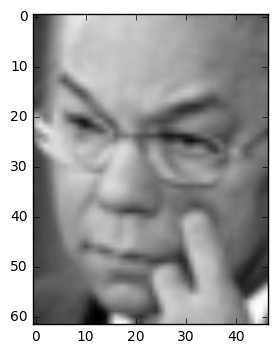

predicted:  Colin Powell  actual:  Colin Powell


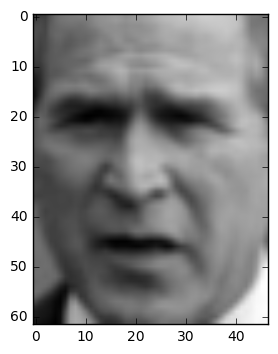

predicted:  George W Bush  actual:  George W Bush


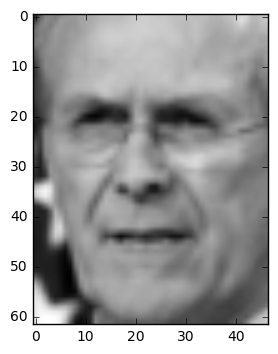

predicted:  Donald Rumsfeld  actual:  Donald Rumsfeld


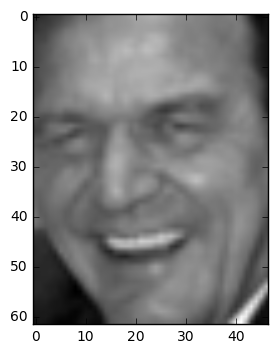

predicted:  Gerhard Schroeder  actual:  Gerhard Schroeder


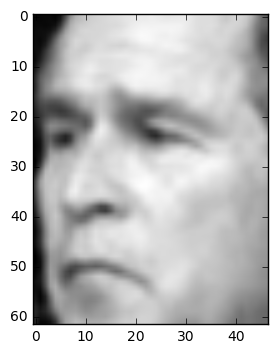

predicted:  George W Bush  actual:  George W Bush


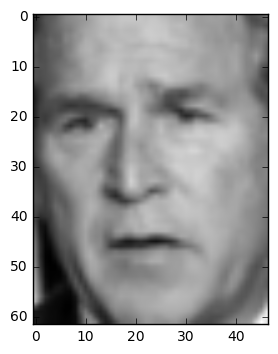

predicted:  George W Bush  actual:  George W Bush


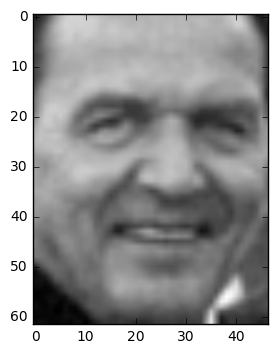

predicted:  Gerhard Schroeder  actual:  Gerhard Schroeder


In [14]:
for i in range(len(predictions)):
    plt.imshow(test_data[i].reshape(62,47),cmap='gray')
    plt.show()
    print("predicted: ",\
    lfw_people.target_names[predictions[i]],\
    " actual: ", lfw_people.target_names[test_target[i]])

In [46]:
#given a list, it calculates the average accuracy
def calculate_avg_accuracy(list):
    return sum(list)/len(list)

#print(calculate_avg_accuracy())
print(calculate_avg_accuracy([0.837209302326, 0.841085271318, 0.829457364341, 0.798449612403, 0.825581395349,
0.802325581395, 0.821705426357, 0.817829457364, 0.872093023256, 0.825581395349 ]))
print(calculate_avg_accuracy([0.856589147287, 0.841085271318, 0.84496124031, 0.806201550388, 0.813953488372,
0.872093023256, 0.856589147287, 0.825581395349, 0.821705426357, 0.837209302326]))
print(calculate_avg_accuracy([0.887596899225, 0.841085271318, 0.817829457364, 0.852713178295, 0.841085271318,
0.852713178295, 0.848837209302, 0.883720930233, 0.84496124031, 0.841085271318]))

print(calculate_avg_accuracy([0.434108527132, 0.418604651163, 0.418604651163, 0.414728682171, 0.418604651163,
0.43023255814, 0.422480620155, 0.348837209302, 0.418604651163, 0.403100775194]))

print(calculate_avg_accuracy([0.395348837209, 0.422480620155, 0.406976744186, 0.37984496124, 0.418604651163,
0.422480620155, 0.418604651163, 0.399224806202, 0.399224806202, 0.418604651163]))

0.8271317829458
0.8375968992250001
0.8511627906978001
0.41279069767459997
0.4081395348838
